# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---
## Step 0: Load The Data

In [1]:
# Load pickled data
import pickle

# Fill this in based on where you saved the training and testing data

training_file = '/Users/olli/Udacity/SDC/P2/traffic-signs-data/train.p'
testing_file = '/Users/olli/Udacity/SDC/P2/traffic-signs-data/test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_test, y_test = test['features'], test['labels']

print("Train features", train['features'].shape, train['features'][0].dtype)
print("Train labels", train['labels'].shape)
print("Train sizes", train['sizes'].shape)
print("Train coords", train['coords'].shape)

print("Test features", test['features'].shape, test['features'][0].dtype)
print("Test labels", test['labels'].shape)
print("Test sizes", test['sizes'].shape)
print("Test coords", test['coords'].shape)


Train features (39209, 32, 32, 3) uint8
Train labels (39209,)
Train sizes (39209, 2)
Train coords (39209, 4)
Test features (12630, 32, 32, 3) uint8
Test labels (12630,)
Test sizes (12630, 2)
Test coords (12630, 4)


---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 2D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below.

In [2]:
### Replace each question mark with the appropriate value.
import numpy as np

# Number of training examples
n_train = len(train['features'])

# Number of testing examples.
n_test = len(test['features'])

# What's the shape of an traffic sign image?
image_shape = train['features'][0].shape

# How many unique classes/labels there are in the dataset.
classes, indices, counts = np.unique(train['labels'], return_index=True, return_counts=True)
n_classes = len(classes)

print("Number of training examples =", n_train)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Training set: Number of classes =", n_classes)
print("Training set: Counts per class ", counts)
print("Training set: Start indices ", indices)

Number of training examples = 39209
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Training set: Number of classes = 43
Training set: Counts per class  [ 210 2220 2250 1410 1980 1860  420 1440 1410 1470 2010 1320 2100 2160  780
  630  420 1110 1200  210  360  330  390  510  270 1500  600  240  540  270
  450  780  240  689  420 1200  390  210 2070  300  360  240  240]
Training set: Start indices  [    0   210  2430  4680  6090  8070  9930 10350 11790 13200 14670 16680
 18000 20100 22260 23040 23670 24090 25200 26400 26610 26970 27300 27690
 28200 28470 29970 30570 30810 31350 31620 32070 32850 33090 33779 34199
 35399 35789 35999 38069 38369 38729 38969]


Visualize the German Traffic Signs Dataset using the pickled file(s). This is open ended, suggestions include: plotting traffic sign images, plotting the count of each sign, etc.

The [Matplotlib](http://matplotlib.org/) [examples](http://matplotlib.org/examples/index.html) and [gallery](http://matplotlib.org/gallery.html) pages are a great resource for doing visualizations in Python.

**NOTE:** It's recommended you start with something simple first. If you wish to do more, come back to it after you've completed the rest of the sections.

[  207   576  2700  4822  7429  9110 10068 11107 11869 13229 15143 17768
 18565 20822 22902 23548 23949 24404 25743 26469 26685 27172 27583 27759
 28232 29238 30382 30645 30994 31446 31838 32510 32885 33627 33956 34406
 35561 35789 37115 38363 38616 38961 39059]


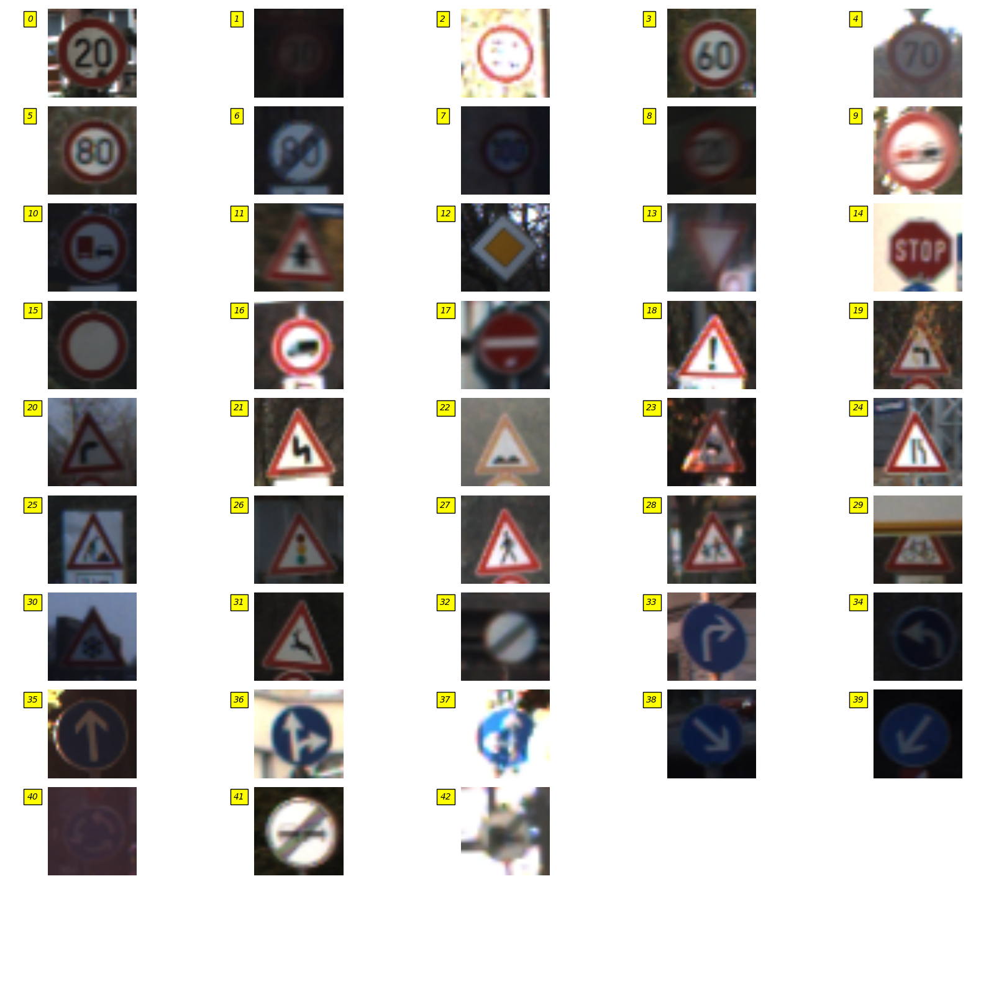

In [3]:
import random

### Data exploration visualization goes here.
### Feel free to use as many code cells as needed.
import matplotlib.pyplot as plt
# Visualizations will be shown in the notebook.
%matplotlib inline

# Select a random sample from each different sign in the training set
indices = np.append(indices,[len(X_train)])
sample_indices = np.zeros(len(classes), dtype=np.int32)
for i in classes:
    sample_indices[i] = random.randint(indices[i], indices[i+1]-1)

print(sample_indices)

# Plot samples
plot_cols = 5
plot_rows = round(len(classes)/plot_cols) + 1
    
fig, axes = plt.subplots(plot_rows, plot_cols, figsize=(20, 20))
fig.subplots_adjust(hspace=0.1, wspace=0.5)

for ax in axes.flat:
    # turn all axis plotting off  
    ax.axis('off')
    
for ax, index in zip(axes.flat, sample_indices):
    # add subplot
    ax.imshow(X_train[index])
    # add label to subplot
    ax.text(-8, 4, train['labels'][index], style='italic', bbox={'facecolor':'yellow' })

plt.show();



Here are some helper functions to be used when looking options for image pre-prosessing. See the following code cells for the application of the functions. However, ** these are not actually used in the implementation later **

In [4]:
import cv2

def rgb2gray(im):
    """ Convert RBG imaget to grayscale image. """
    # Y = 0.2126 * R + 0.7152 * G + 0.0722 * B
    Y = np.empty(im[0].shape, dtype='float')
    R = im[:,:,0]
    G = im[:,:,1]
    B = im[:,:,2]
    Y = 0.2126 * R + 0.7152 * G + 0.0722 * B
    return Y.astype('uint8')
    
def normalize(im):
    """ Intensity normalization of a grayscale image. """
    im_min = im.min()
    old_range = im.max() - im_min
    return np.floor( (im.astype('float') - im_min) / old_range * 255.).astype('uint8')


def partially_equalize_rgb(im):
    """ Partial histogram equalization of an rgb image. """
    """ Convert to YCrCb and equalize the luminance channel (0) """
    alfa = 0.5
    im2 = cv2.cvtColor(im, cv2.COLOR_RGB2YCrCb)

    # histogram equalization from http://docs.opencv.org/trunk/d5/daf/tutorial_py_histogram_equalization.html
    hist = np.histogram(im2[:,:,0].flatten(),256,[0,256])[0]
    cdf = hist.cumsum()
    cdf = cdf * hist.max() / cdf.max() # normalize
    cdf_m = np.ma.masked_equal(cdf,0)
    cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max()-cdf_m.min())
    cdf = np.ma.filled(cdf_m, 0)
    
    # blend cumulative distribution function with identity transform
    identity = np.arange(256)
    cdf_p = alfa * cdf + (1-alfa) * identity
    
    im2[:,:,0] = cdf_p[im2[:,:,0].astype('int')].astype('uint8')
    
    im2 = cv2.cvtColor(im2, cv2.COLOR_YCrCb2RGB)
    return im2.astype('uint8')

def equalize_rgb(im):
    """ Histogram equalization of an rgb image. """
    """ Convert first to YCrCb and equalize the luminance channel """
    im2 = cv2.cvtColor(im, cv2.COLOR_RGB2YCrCb)
    im2[:,:,0] = cv2.equalizeHist(im2[:,:,0])
    im2 = cv2.cvtColor(im2, cv2.COLOR_YCrCb2RGB)
    return im2.astype('uint8')

def clahe_equalize_rgb(im):
    """ Contrast Limited Adaptive histogram equalization of an rgb image. """
    """ Apply CLAHE-function from OpenCV """
    clahe = cv2.createCLAHE(clipLimit=40.0, tileGridSize=(8,8))
    im2 = cv2.cvtColor(im, cv2.COLOR_RGB2YCrCb)
    im2[:,:,0] = clahe.apply(im2[:,:,0])
    im2 = cv2.cvtColor(im2, cv2.COLOR_YCrCb2RGB)
    return im2.astype('uint8')

def normalize_rgb(im):
    """ Intensity normalization of a rgb image """
    im2 = cv2.cvtColor(im, cv2.COLOR_RGB2YCrCb)
    im2[:,:,0] = normalize(im2[:,:,0].astype('float'))
    im2 = cv2.cvtColor(im2, cv2.COLOR_YCrCb2RGB)
    return im2.astype('uint8')

def equalize2gray(im):
    """ Return histogram equalized grayscale image from an rgb image """
    im2 = rgb2gray(im)
    return cv2.equalizeHist(im2)

def normalize2gray(im):
    """ Return histogram equalized grayscale image from an rgb image """
    return normalize(rgb2gray(im.astype('float'))).astype('uint8')


Below, I have explored some brightness and contrast enhancements methods and tried visually estimate which would be good compromise. **Brightness normalization** seems to be sufficient in most cases. If the contrast to background is very high or image very dark, **histogram equalization** gives better results. This method however, seems to add noise, which I suppose would not make scores better. The increased noise may be because of small image size. Another equalization method, which produce good results on big images, **CLAHE** (contrast limited adaptive histogram equalization) is even more noisy. 

I managed to reduce noise somewhat using **partial histogram equalization**. In this method identity transform is blended with equalized cumultive distribution function (It is, the original image is blended with the equalized image). ** These image 'enhancements' are not used in training data **

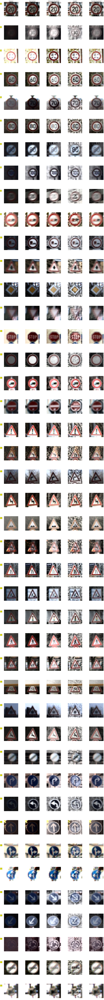

In [5]:
# Visually compare preprocessing methods

fig, axes = plt.subplots(len(sample_indices), 5, figsize=(20, 200))
fig.subplots_adjust(hspace=0.1, wspace=0.5)

for ax in axes.flat:
    ax.axis('off')

axes[0,0].set_title('Original')
axes[0,1].set_title('Normalised')
axes[0,2].set_title('Histogram Equalised')
axes[0,3].set_title('CLAHE')
axes[0,4].set_title('Partially Equalised')
    
for index, i in zip(sample_indices, range(0,len(sample_indices))):
    axes[i,0].imshow(X_train[index])
    axes[i,1].imshow(normalize_rgb(X_train[index]))
    axes[i,2].imshow(equalize_rgb(X_train[index]))
    axes[i,3].imshow(clahe_equalize_rgb(X_train[index]))
    axes[i,4].imshow(partially_equalize_rgb(X_train[index]))

    # add label to subplot
    axes[i,0].text(-8, 4, train['labels'][index], style='italic', bbox={'facecolor':'yellow' })

plt.show();


----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

There are various aspects to consider when thinking about this problem:

- Neural network architecture
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

**NOTE:** The LeNet-5 implementation shown in the [classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) at the end of the CNN lesson is a solid starting point. You'll have to change the number of classes and possibly the preprocessing, but aside from that it's plug and play!

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [6]:
def normalize_input(im):
    """ Convert image to float and normalize scale between -1.0 and 1.0 """
    return (im.astype('float') - 128.) / 128.


In [4]:
# Preprocessing
#

# Create training and test set
X_all  = np.empty(train['features'].shape, dtype='float')
y_all  = train['labels']

#  Normalize data between -1.0 and 1.0
for i in range(0, len(X_train)):
    X_all[i] = normalize_input(train['features'][i])

In [5]:
# Shuffle training data
from sklearn.utils import shuffle
X_all, y_all = shuffle(X_all, y_all)

from sklearn.model_selection import train_test_split
# Split training set to training and validation sets
# NOTE: this could be done before running each epoch ('cross-validation')
X_train, X_validation, y_train, y_validation = train_test_split(X_all, y_all, test_size=0.20, random_state=0)

In [6]:
# check
print(X_train[0].max(), X_train[0].min())
#print(X_train[0])
print(X_validation[0].max(), X_validation[0].min())
#print(X_validation[0])

-0.40625 -0.8828125
0.96875 -0.8828125


### Question 1 

_Describe how you preprocessed the data. Why did you choose that technique?_

**Answer:** Pixel data was normalized to scale [-1.0,1.0] and converted to float. This takes the mean of training data closer to zero, which makes it easier for the optimizer to handle. Floating point representation is essential to prevent computation errors. 

There is no separate validation data set. Because of this validation data was extracted from the training data. The amount of validation data varied between 20% and 33% of the training data (15% to 25% of the whole data set.)

Also, the whole data set is shuffled to random order. This prevents sorting order of the input to have effect on the results. This is also done again later on in a training phase. 

In [7]:
### Generate data additional data (OPTIONAL!)
### and split the data into training/validation/testing sets here.
### Feel free to use as many code cells as needed.

### Question 2

_Describe how you set up the training, validation and testing data for your model. **Optional**: If you generated additional data, how did you generate the data? Why did you generate the data? What are the differences in the new dataset (with generated data) from the original dataset?_

**Answer:** The fastest way to increase training set size would be  to generate transforms (rotation, affine transforms, perspective transfroms) from the existing data set and images. This can easily result to many times larger training set. The larger the training set is, the better training accurary it can yield. Also, ideally there should be (at least almost) equal amount of images from each different traffic sign both in the training set and the validation set.

For now, I will skip this phase and complete it later, if there is time for it.

TODO: examine img_transform_NB for this.

In [7]:
### Define your architecture here.
### Feel free to use as many code cells as needed.

import tensorflow as tf

#
# Hyperparameters to play with
#
EPOCHS = 20
BATCH_SIZE = 256

μ = 0.0    # The mean of the truncated normal distribution
σ = 0.1    # The standard deviation of the truncated normal distribution
η = 0.005  # Learning rate

In [8]:
# Define variables

x = tf.placeholder(tf.float32, (None, 32, 32, 3)) # placeholder for a batch of input images
y = tf.placeholder(tf.int32, (None)) # y is a placeholder for a batch of output labels
one_hot_y = tf.one_hot(y, 43)
P = tf.placeholder(tf.float32) # dropout keep probability

weights = {
    # Layer 1: input 32x32x3, output 28x28x6, after pooling 14x14x6
    'layer_1': tf.Variable(tf.truncated_normal(shape=(5, 5, 3, 6), mean=μ, stddev=σ)),
    # Layer 2: input 14x14x6, output 10x10x16, output = 5x5x16.
    'layer_2': tf.Variable(tf.truncated_normal(shape=(5, 5, 6, 16), mean=μ, stddev=σ)),
    # Layer 3: input = 400 (5x5x16), output = 120.
    'layer_3': tf.Variable(tf.truncated_normal(shape=(400, 120), mean=μ, stddev=σ)),
    # Layer 4: input = 120, output = 84.
    'layer_4': tf.Variable(tf.truncated_normal(shape=(120, 84), mean=μ, stddev=σ)),
    # Layer 5: input = 84, output = 43.
    'layer_5': tf.Variable(tf.truncated_normal(shape=(84, 43), mean=μ, stddev=σ))
}

biases = {
    'layer_1': tf.Variable(tf.zeros(6)),
    'layer_2': tf.Variable(tf.zeros(16)),
    'layer_3': tf.Variable(tf.zeros(120)),
    'layer_4': tf.Variable(tf.zeros(84)),
    'layer_5': tf.Variable(tf.zeros(43))
}


In [9]:
# define saver object
saver = tf.train.Saver()
ckpt = './traffic_signs'

In [10]:
# LeNet implementation

def convolutional_layer(x, W, b, k1=1, k2=2):
    # Convolutional layer calculations with ReLU activation and pooling
    x = tf.nn.conv2d(x, W, strides=[1, k1, k1, 1], padding='VALID')
    x = tf.nn.bias_add(x, b)
    x = tf.nn.relu(x)
    return tf.nn.max_pool(x, ksize=[1, k2, k2, 1], strides=[1, k2, k2, 1], padding='VALID')

def fully_connected_layer(x, W, b, P):
    # Fully connected hidden layer calculations with ReLU activation
    x = tf.matmul(x, W)
    x = tf.nn.bias_add(x, b)
    x = tf.nn.relu(x)
    return tf.nn.dropout(x, P)

def output_layer(x, W, b):
    # Output layer calculations
    x = tf.matmul(x, W)
    return tf.nn.bias_add(x, b)


def LeNet5(inp, prob):
    """ Modified LeNet5 implementation """
    """ Parameters: initial weights, dropout keep probability """
    layer1 = convolutional_layer(inp,    weights['layer_1'], biases['layer_1'], k1=1, k2=2)
    layer2 = convolutional_layer(layer1, weights['layer_2'], biases['layer_2'], k1=1, k2=2)
    layer3 = tf.contrib.layers.flatten(layer2)
    layer3 = fully_connected_layer(layer3, weights['layer_3'], biases['layer_3'], prob)
    layer4 = fully_connected_layer(layer3, weights['layer_4'], biases['layer_4'], prob)
    layer5 = output_layer(layer4, weights['layer_5'], biases['layer_5'])  
    return layer5


### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  For reference on how to build a deep neural network using TensorFlow, see [Deep Neural Network in TensorFlow
](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/b516a270-8600-4f93-a0a3-20dfeabe5da6/concepts/83a3a2a2-a9bd-4b7b-95b0-eb924ab14432) from the classroom._


**Answer:** I chose the traditional LeNet5 architecture that was used in the previous tensorflow lab. Because I don't have earlier experience on DNN design, this was a safe choice. Also, this is the only architecture that has been introduced in the lecture material so far. Other designs will be introduced in later lessons.

LeNet has two convolutional layers followed by three fully connected layers. Input to the network is 32x32x3 pixel images, and final output is 43 logits. ReLU activation was used in each layer (except output layer). Convolutional layer use max pooling. In addition, dropout phase was added to fully connected hidden layers. This was expected to reduce overfitting of the model.

In [11]:
# Training pipeline

logits = LeNet5(x, P)
cross_entropy = tf.nn.softmax_cross_entropy_with_logits(logits, one_hot_y)
loss_operation = tf.reduce_mean(cross_entropy)
optimizer = tf.train.AdamOptimizer(learning_rate = η)
training_operation = optimizer.minimize(loss_operation)

In [12]:
# Model evaluation: Evaluate how well the loss and accuracy of the model for a given dataset.

correct_prediction = tf.equal(tf.argmax(logits, 1), tf.argmax(one_hot_y, 1))
accuracy_operation = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

def evaluate(X_data, y_data):
    num_examples = len(X_data)
    total_accuracy, total_loss = 0, 0
    session = tf.get_default_session()
    for offset in range(0, num_examples, BATCH_SIZE):
        batch_x, batch_y = X_data[offset:offset+BATCH_SIZE], y_data[offset:offset+BATCH_SIZE]
        loss, accuracy =  session.run([loss_operation, accuracy_operation], feed_dict={x: batch_x, y: batch_y, P: 1.0})
        total_accuracy += (accuracy * batch_x.shape[0])
        total_loss     += (loss * batch_x.shape[0])
    return total_loss / num_examples, total_accuracy / num_examples

In [14]:
with tf.Session() as session:
    session.run(tf.global_variables_initializer())
    num_examples = len(X_train)
    
    print("Training...")
    print()
    for i in range(EPOCHS):
        X_train, y_train = shuffle(X_train, y_train)
        for offset in range(0, num_examples, BATCH_SIZE):
            end = offset + BATCH_SIZE
            batch_x, batch_y = X_train[offset:end], y_train[offset:end]
            loss = session.run(training_operation, feed_dict={x: batch_x, y: batch_y, P: 0.5})
            
        validation_loss, validation_accuracy = evaluate(X_validation, y_validation)
        print("EPOCH {} ...".format(i+1))
        print("Validation Loss     = {:.3f}".format(validation_loss))
        print("Validation Accuracy = {:.3f}".format(validation_accuracy))
        print()
        
    saver.save(session, ckpt)
    print("Model saved")

Training...

EPOCH 1 ...
Validation Loss     = 0.936
Validation Accuracy = 0.714

EPOCH 2 ...
Validation Loss     = 0.470
Validation Accuracy = 0.860

EPOCH 3 ...
Validation Loss     = 0.298
Validation Accuracy = 0.905

EPOCH 4 ...
Validation Loss     = 0.229
Validation Accuracy = 0.928

EPOCH 5 ...
Validation Loss     = 0.194
Validation Accuracy = 0.944

EPOCH 6 ...
Validation Loss     = 0.167
Validation Accuracy = 0.954

EPOCH 7 ...
Validation Loss     = 0.187
Validation Accuracy = 0.948

EPOCH 8 ...
Validation Loss     = 0.127
Validation Accuracy = 0.966

EPOCH 9 ...
Validation Loss     = 0.163
Validation Accuracy = 0.954

EPOCH 10 ...
Validation Loss     = 0.115
Validation Accuracy = 0.972

EPOCH 11 ...
Validation Loss     = 0.119
Validation Accuracy = 0.968

EPOCH 12 ...
Validation Loss     = 0.107
Validation Accuracy = 0.972

EPOCH 13 ...
Validation Loss     = 0.094
Validation Accuracy = 0.977

EPOCH 14 ...
Validation Loss     = 0.113
Validation Accuracy = 0.967

EPOCH 15 ...
Val

## Model testing

In [13]:
# Normalize test set:
# run this only once!
X_test = np.empty(test['features'].shape, dtype='float')
y_test = test['labels']

#  Normalize data between -1.0 and 1.0
for i in range(0, len(X_test)):
    X_test[i] = normalize_input(test['features'][i])

print(X_test[0].max(), X_test[0].min())

0.4296875 -0.953125


In [14]:
#with tf.Session() as session:
#    session.run(tf.global_variables_initializer())

# Load the model that gave the best accuracy
ckpt = './model_drop6/traffic_signs'

In [15]:
# Test the model
with tf.Session() as session:
    #loader = tf.train.import_meta_graph('traffic_signs.meta')
    #loader.restore(session, tf.train.latest_checkpoint('./traffic_signs'))
    saver.restore(session, ckpt)

    test_loss, test_accuracy = evaluate(X_test, y_test)
    print("Test Loss     = {:.3f}".format(test_loss))
    print("Test Accuracy = {:.3f}".format(test_accuracy))

Test Loss     = 0.370
Test Accuracy = 0.956


### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)_


**Answer:** 

Three slightly different models were used:
- Basic: Basic LeNet5 as in the earlier tensorflow lab
- Cross: Basic LeNet5. The difference to the previous was that training/validation sets were selected anew each time new epoch was started. Here I tried to achieve some kind of 'cross-validation' effect.
- Drop: Basic LeNet5 with added dropout to fully connected hidden layers

Note: validation data has not been the same all the time. (Va-column is the size of validation data)

After initial test rounds, the following training rounds were recorded:

| Round     | EPOCH | BATCH |  μ  |  σ  |  η  |  P  | Va  | **V Loss** |**V Accuracy** |**Test Loss**|**Test Accuracy**|
|-----------|-------|-------|-----|-----|-----|-----|-----|-------- |-------------|---------|------------|
| Basic 1   |    10 |   128 | 0.0 | 0.1 |0.01 |  -  | 15% |   0.247 |       0.942 |
| Basic 2   |    20 |   128 | 0.0 | 0.1 |0.01 |  -  | 15% |   0.363 |       0.926 |
| Basic 3   |    20 |   128 | 0.0 | 0.1 |0.005|  -  | 15% |   0.122 |       0.983 |
| Basic 4   |    20 |   128 | 0.0 | 0.05|0.005|  -  | 15% |   0.214 |       0.965 |
| Basic 5   |    30 |   128 | 0.0 | 0.05|0.005|  -  | 15% |   0.435 |       0.926 |
| Basic 6   |    20 |   256 | 0.0 | 0.1 |0.005|  -  | 15% |   0.136 |       0.979 |
| Basic 7   |    20 |    32 | 0.0 | 0.1 |0.005|  -  | 15% |   0.380 |       0.942 |
| Basic 8   |    20 |   128 | 0.0 | 0.1 |0.005|  -  | 25% |   1.072 |       0.706 |
| Cross 1   |    20 |   128 | 0.0 | 0.1 |0.005|  -  | 25% |   1.014 |       0.716 |
| Cross 2   |    20 |   128 | 0.0 | 0.1 |0.005|  -  | 15% |   1.634 |       0.839 |
| Drop 1    |    20 |   128 | 0.0 | 0.1 |0.005| 0.5 | 19% |   0.181 |       0.945 |
| Drop 2    |    50 |   128 | 0.0 | 0.1 |0.005| 0.5 | 19% |   0.132 |       0.967 |
| Drop 3    |   100 |   128 | 0.0 | 0.05|0.005| 0.5 | 15% |   0.098 |       0.976 | 0.402 | 0.925 |
| Drop 4    |    10 |   128 | 0.0 | 0.05|0.001| 0.5 | 15% |   0.151 |       0.962 |
| Drop 5    |    50 |   256 | 0.0 | 0.1 |0.001| 0.5 | 15% |   0.049 |       0.989 |
| Drop 6    |   200 |   256 | 0.0 | 0.1 |0.001| 0.5 | 15% |   0.048 |       0.994 | 0.370 | 0.956 |
| Drop 7    |    50 |   256 | 0.0 | 0.1 |0.0005| 0.5 | 15% |   0.068 |       0.984 |
| Drop 8    |   100 |   256 | 0.0 |0.01 |0.001| 0.5 | 15% |   0.085 |       0.985 | 0.382 | 0.938 |

From the table above, one can see, that the Cross-model was not very successful. Probably the implementation was buggy. I need to study cross validation a bit more. Also, bigger data set (with augmented additional images) would be needed befor the proportional size of the validation set can be increased.

Basic and Drop are not much different. It is clear, that increasing number of epochs and lowering learning rate gives best results. Also batch size 256 seemed to be better than 128 (Basic 4 vs Basic 6).



### Question 5


_What approach did you take in coming up with a solution to this problem? It may have been a process of trial and error, in which case, outline the steps you took to get to the final solution and why you chose those steps. Perhaps your solution involved an already well known implementation or architecture. In this case, discuss why you think this is suitable for the current problem._

**Answer:** LeNet seemed to fit perfectly to the classification problem (a proven solution). Size of the input data was also fitted for the network. After several training rounds, the model 'Drop 6' was selected, because it gave best validation and test results. 

This solution was achieved by changing the hyperparameters one at a time. If the change was successful, some other change was tried. Finally, number of epochs was increased (max. 200).

Testing the model gave 5% smaller accuracy than during validation. Larger training and validation data sets would probably help in redusing this difference. Test loss was almost one order of magnitude larger than validation loss (.0370 vs 0.048). I wonder what might be reason for this?

One could quite easily automate the hyperparameter tuning. It can normally be seen after 10-20 rounds if the change has been benificial. If not, step back and try another change. Otherwise continue with more epochs until accurasy settles.


---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [16]:
import numpy as np
import matplotlib.pyplot as plt
# Visualizations will be shown in the notebook.
%matplotlib inline

path = '/Users/olli/Udacity/SDC/P2/new_signs/'
names = [  
    '2_speed_limit_50.png',
    '25_road_work.png',
    '26_traffic_signals.png',
    '28_children_crossing.png',
    '30_beware_of_ice_snow.png',
    '31_wild_animals_crossing.png'
]

X_new = np.empty((0,32,32,3))

# Preset labels for the new images
y_new = [2, 25, 26, 28, 30, 31]

for name in names:
    X_new = np.append(X_new, [plt.imread(path+name)[:,:,:3]], axis=0)
    
#print(X_new.shape) # check the shape
#print(X_new[0].max(), X_new[0].min()) # check the current range

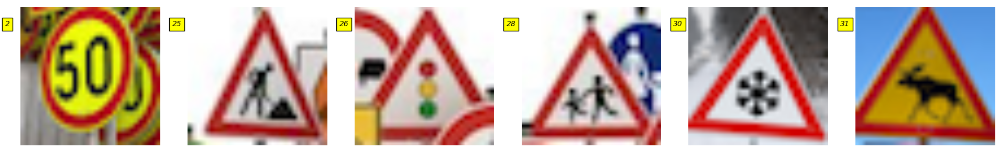

In [14]:
# Plot new images 

fig, axes = plt.subplots(1, 6, figsize=(24, 6))
fig.subplots_adjust(hspace=0.1)

for ax, index in zip(axes.flat, range(0,len(X_new))):
    ax.imshow(X_new[index])
    ax.text(-4, 4, y_new[index], style='italic', bbox={'facecolor':'yellow' })
    ax.axis('off')

plt.show();

In [15]:
# How is the class represented in the training set?

for label in y_new:
    print (label, (y_train == label).sum())


2 2250
25 1500
26 600
28 540
30 450
31 780


In [17]:
# scale new images between -1.0 and 1.0
print(X_new[0].max(), X_new[0].min()) # check

for i in range(0, len(X_new)):
    X_new[i] = (X_new[i]*2)-1.0
    
print(X_new[0].max(), X_new[0].min()) # check

1.0 0.0
1.0 -1.0


### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It could be helpful to plot the images in the notebook._


**Answer:** Images were searched from the Internet, traffic signs cropped to a square boxes and scaled to 32x32 pixels. The selected images are (6 instead of 5):

- 50 km/h limit: This is local (Finnish) version. It is pretty much like the German one, but the background is yellow instead of white. Also, there are several other signs stacked in the background, which might disturb classification.
- Road work: Similar to the sign in test set. Should be easily classified.
- Traffic signals: Similar to the one in the training set. There are parts of other signs in the front of and behind of the sign.
- Children crossing: Same sign as in the training set. In the backround you can see another traffic sign, which might confuse the classifier.
- Beware of ice and snow: Exactly the same sign as in the training material.
- Beware of elks: Very similar to German 'Wild animals crossing' sign, but this is local (Finnish) sign warns for elks. In addition to different animal figure on sign, the background is yellow.

All pictures are very good quality in terms of brightness, contrast and noise. So there shouldn't be too much of problems to classify those.

I expect the model to correctly classify the five first images. For the last one, there is picture of an elk (moose) instead of a deer. It is easy for a human to see the equivalence, but I don't expect the model to recognize it. After all, it is totally different sign.

In [17]:
### Run the predictions here.
### Feel free to use as many code cells as needed.

In [18]:
# Test each image separately against preset labels
with tf.Session() as session:
    #session.run(tf.global_variables_initializer())
    #loader = tf.train.import_meta_graph('traffic_signs.meta')
    #loader.restore(session, tf.train.latest_checkpoint('./'))
    saver.restore(session, ckpt)

    for i in range(0, len(X_new)):
        loss, accuracy = evaluate(X_new[i:i+1], y_new[i:i+1])
        print(y_new[i], "Test Loss     = {:.3f}".format(loss))
        print(y_new[i], "Test Accuracy = {:.3f}".format(accuracy))

2 Test Loss     = 8.447
2 Test Accuracy = 0.000
25 Test Loss     = 0.000
25 Test Accuracy = 1.000
26 Test Loss     = 0.000
26 Test Accuracy = 1.000
28 Test Loss     = 0.000
28 Test Accuracy = 1.000
30 Test Loss     = 0.218
30 Test Accuracy = 1.000
31 Test Loss     = 30.888
31 Test Accuracy = 0.000


### Question 7

_Is your model able to perform equally well on captured pictures when compared to testing on the dataset? The simplest way to do this check the accuracy of the predictions. For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate._

_**NOTE:** You could check the accuracy manually by using `signnames.csv` (same directory). This file has a mapping from the class id (0-42) to the corresponding sign name. So, you could take the class id the model outputs, lookup the name in `signnames.csv` and see if it matches the sign from the image._


**Answer:** Model could predict all the signs that were in the dataset very accurately. The two new signs it could not recognize (Although the speed limit sign is very similar to the one in the dataset).

** Addition after first review ** The model predicted correctly 2 out of 6 the new signs. That gives accuracy of 60% which is less than the test accurary of 96%. Why the figure is smaller, is partly because I had one sign that was not present in the training set. However, there was a sign that should have been identified (50 km/h). Clearly the model should be trained more in order to cope real world situation.

### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*

`tf.nn.top_k` will return the values and indices (class ids) of the top k predictions. So if k=3, for each sign, it'll return the 3 largest probabilities (out of a possible 43) and the correspoding class ids.

Take this numpy array as an example:

```
# (5, 6) array
a = np.array([[ 0.24879643,  0.07032244,  0.12641572,  0.34763842,  0.07893497,
         0.12789202],
       [ 0.28086119,  0.27569815,  0.08594638,  0.0178669 ,  0.18063401,
         0.15899337],
       [ 0.26076848,  0.23664738,  0.08020603,  0.07001922,  0.1134371 ,
         0.23892179],
       [ 0.11943333,  0.29198961,  0.02605103,  0.26234032,  0.1351348 ,
         0.16505091],
       [ 0.09561176,  0.34396535,  0.0643941 ,  0.16240774,  0.24206137,
         0.09155967]])
```

Running it through `sess.run(tf.nn.top_k(tf.constant(a), k=3))` produces:

```
TopKV2(values=array([[ 0.34763842,  0.24879643,  0.12789202],
       [ 0.28086119,  0.27569815,  0.18063401],
       [ 0.26076848,  0.23892179,  0.23664738],
       [ 0.29198961,  0.26234032,  0.16505091],
       [ 0.34396535,  0.24206137,  0.16240774]]), indices=array([[3, 0, 5],
       [0, 1, 4],
       [0, 5, 1],
       [1, 3, 5],
       [1, 4, 3]], dtype=int32))
```

Looking just at the first row we get `[ 0.34763842,  0.24879643,  0.12789202]`, you can confirm these are the 3 largest probabilities in `a`. You'll also notice `[3, 0, 5]` are the corresponding indices.

In [19]:
# Take softmax probabilities

softmax = tf.nn.softmax(logits)

with tf.Session() as session:
    saver.restore(session, ckpt)
    predictions = session.run(softmax, feed_dict={x: X_new, P: 1.0})
    
# print(predictions[0])

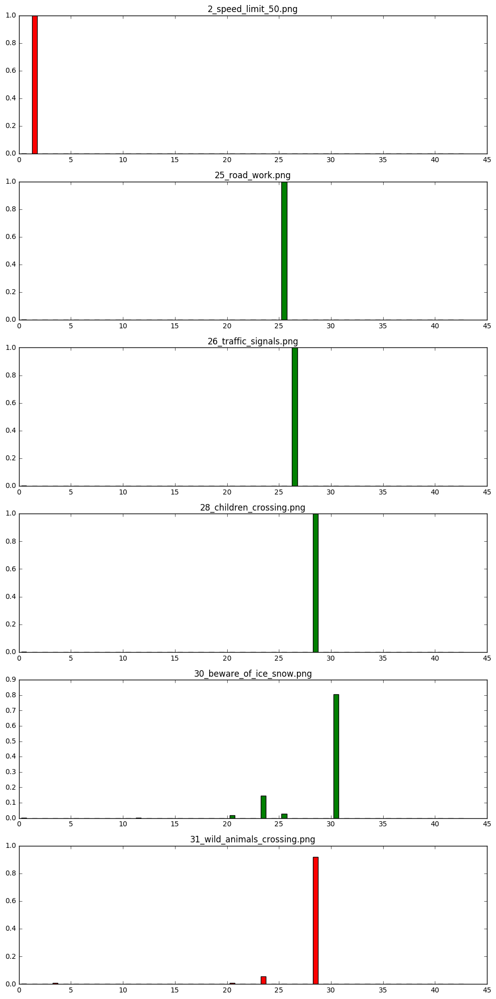

In [20]:
import numpy as np
import matplotlib.pyplot as plt
# Visualizations will be shown in the notebook.
%matplotlib inline

nbins = len(predictions[0])
x = np.arange(nbins)

fig, axes = plt.subplots(nrows=len(names), ncols=1, figsize=(10, 20))

for i in range(0,6):
    # Green bars if prediction correct
    if predictions[i].argmax() == y_new[i]:
        color = 'green'
    else:
        color = 'red'
    axes[i].hist(x, nbins, weights=predictions[i], range=(0, nbins), histtype='bar', rwidth=0.5, color=color)
    axes[i].set_title(names[i])

plt.tight_layout()
plt.show()

In [21]:
# Get top 3 predictions

top3 = tf.nn.top_k(predictions, k=3)

with tf.Session() as session:
    tops = session.run(top3)
    print(tops)


TopKV2(values=array([[  9.99785483e-01,   2.14551779e-04,   2.80802781e-09],
       [  1.00000000e+00,   3.28150156e-15,   2.53299687e-19],
       [  9.99995112e-01,   4.87815032e-06,   8.00711407e-12],
       [  1.00000000e+00,   5.97613102e-22,   3.95533217e-23],
       [  8.04426610e-01,   1.47156626e-01,   2.78108269e-02],
       [  9.21380043e-01,   5.69615886e-02,   1.02766976e-02]], dtype=float32), indices=array([[ 1,  2, 13],
       [25, 20, 11],
       [26, 18, 15],
       [28, 30, 29],
       [30, 23, 25],
       [28, 23,  3]], dtype=int32))


**Answer:** From the plot we can see that the model is very sure about the correct predictions. On the other hand, it seems to be very certain that 50 km/h sign is 30 km/h sign. The certainty here is confusing. The correct choice is second in top 3 list, but with very low certainty.

The sign that is not in the original dataset (beware of elks), is interpreted as 28 - children crossing on very high level of confidence (92%).

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.